## Projected Gradient method

1. Initialisation: $u_0\in U_{ad}$, $k:=0$
2. Compute $y_k$ as solution to (SE)
<!---$$\tag{SE} \left\{\begin{aligned}
%-\Delta y&=u && \text{in}\ \Omega\\
%\frac{\partial y}{\partial\nu}&=0&&\text{on}\ \partial\Omega
%\end{aligned}\right.$$-->
3. Compute $p_k$ as solution to (AE).
4. Define $v_k:=-f'(u_k)=-(p_k+\gamma u_k)$
5. Compute the exact step length $s_k$ such that
$$f(u_k+s_kv_v)=\min\limits_{s>0} f(u_k+sv_k)$$
6. Put $u_k=\mathscr P_{[\xi_0,\xi_1]}(u_k+s_kv_k)$
7. Repeat from step 2.

## Every start ...

Here is a very simple first thought. From the last exercises we already know how to solve the Poisson equation with Dirichlet or Neumann boundary conditions. Since here we want to do the same, this might be helpful. The methods here need some redefinement. Also pay attention: The `GradientMethod` as well as other functions use other functions that are just assumed to be there. So they do not get these functions as argument, which may break the entire program.

In [ ]:
using Optim
using Gridap
using GridapMakie, CairoMakie, FileIO

function SolvePoissonDirichlet(domain,u,parts,order)
	"""
	Solves
	-Δy=u in domain
	y=0   on boundary
	where
	domain - given as input as for Gridap
	parts  - number of partitions
	order  - order of numerical interpolation method
	"""
	partition = (parts,parts)
	model = CartesianDiscreteModel(domain,partition)
  
	reffe = ReferenceFE(lagrangian,Float64,order)
	V0 = TestFESpace(model,reffe,conformity=:H1,dirichlet_tags="boundary")
	U = TrialFESpace(V0)
  
	degree = 2*order
	Ω = Triangulation(model)
	dΩ = Measure(Ω,degree)
  
	a(u,v) = ∫( ∇(v)⊙∇(u) )*dΩ
	l(v) = ∫( v*f )*dΩ
  
	op = AffineFEOperator(a,l,U,V0)
  
	uh = solve(op)
  
	return uh  
end

function SolvePoissonNeumann(domain,u,parts,order)
	"""
	Solves
	-Δy=u in domain
	-∂y/∂ν=0   on boundary
	where
	domain - given as input as for Gridap
	parts  - number of partitions
	order  - order of numerical interpolation method
	"""
	partition = (parts,parts)
	model = CartesianDiscreteModel(domain,partition)
  
	reffe = ReferenceFE(lagrangian,Float64,order)
	V0 = TestFESpace(model,reffe,conformity=:H1)
	Vg = TrialFESpace(V0)

	Ω = Triangulation(model)
	dΩ = Measure(Ω,degree)

	Γ = BoundaryTriangulation(model,tags=["boundary"])
	dΓ = Measure(Γ,degree)

	a(u,v) = ∫( ∇(v)⊙∇(u))*dΩ
	l(v) = ∫( v*f )*dΩ + ∫( v*g )*dΓ

	op = AffineFEOperator(a,l,Vg,V0)

	uh = solve(op)

	return uh  
end

domain = (0,1,0,1)
ξ₀(x)=0
ξ₁(x)=1
partition = (5,5)
model = CartesianDiscreteModel(domain,partition)
order=1
reffe = ReferenceFE(lagrangian,Float64,order)
V0 = TestFESpace(model,reffe,conformity=:H1)
U = TrialFESpace(V0)

degree = 2*order
Ω = Triangulation(model)
dΩ = Measure(Ω,degree)

L2(u,v)=l(v) = ∫( u*v )*dΩ
f(s,y,y_d,u,v)=s*L2(y-y_d,u)+1/2*s^2*L2(u,u)+γ/2*L2(u,u)+γ*s*L2(u,v)+γ/2*s^2*L2(v,v)

function ProjectedGradientMethod(domain,y_d,u,γ,ξ₀,ξ₁)
	parts=100
	order=2
	ys=[]
	ps=[]
	us=[u0]
	for k=1:100
		y=SolvePoissonDirichlet(domain,u,parts,order)
		p=SolvePoissonDirichlet(domain,x->y(x)-y_d(x),parts,order)
		v(x)=-(p(x)+γ*u(x))
		s=Optim.minimizer(optimize(s->f(s,y,y_d,u,v),[0.0]))
		u(x)=map(x->(x<ξ₀(x))*ξ₀(x)+(ξ₀(x)<x<ξ₁(x))*x+(x>ξ₁(x))*ξ₁(x) , u(x)+s*v(x))
		push!(ys,y)
		push!(ps,p)
		push!(us,u)
	end
	return (ys,ps,us)
end

ξ₀(x)=0
ξ₁(x)=1

ProjectedGradientMethod(domain,y_d,u,γ,ξ₀,ξ₁)

## A little better

And here is the more advanced version. All arguments are optional and named, so they have to be given by their name as in `a=testfunction(arg="I'm the argument")`. Every argument without default values (the ones with an = like `tol=1e-3`) has to be given. Since I did not want to make it too difficult, this programm does not check for anything and will error quite quickly, if arguments are given in the wrong way. See the green text at the beginning of the programm for explanations on the arguments. Pay special attention to the `s_min`argument, which if given makes the program perform exact line search, and otherwise use the Armijo rule.

In [6]:
using Gridap
using GridapMakie, CairoMakie, FileIO
using Gridap.FESpaces
using Gridap.ReferenceFEs
using Gridap.Arrays
using Gridap.Algebra
using Gridap.Geometry
using Gridap.Fields
using Gridap.CellData
using FillArrays
using Test
using InteractiveUtils

function GradientDescent(;solveSE, solveAE, spaces, dΩ, dΓ=nothing, J, ∇j, iter_max=2000, tol=1e-3, P=x->x, u0=nothing, w=nothing, s_min=nothing, sminargs=nothing, armijoparas=(ρ=1/2, α_0=1024.0, α_min=1/2^5, σ=1e-4), saveall::Bool=false)
	#=
	Solves any CP with possibly box bounds
	Input: (all are named arguments - oder does not matter, but they have to be called by name)
	  solveSE   - a method to solve the SE, Input: u (rhs), Trialspace, Testspace. optional: dΩ, dΓ, cache from earlier execution, y_dof pre-solution in vector-form to write on. Output: solution, cache
	  solve AE  - a method to solve the AE, Input: y (rhs), Trialspace, Testspace. optional: dΩ, dΓ, cache from earlier execution, p_dof pre-solution in vector-form to write on. Output: solution, cache
	  spaces    - tuple of (trial space, test space, FE space)
	  dΩ        - measure on Ω
	  dΓ        - measure on ∂Ω=Γ (optional)
	  J         - functional to minimise (only needed for early breaking out of loop)
	  ∇f        - functional to compute gradient of reduced cost f
	  iter_max  - number of maximum iterations (default 2000)
	  tol       - tolerance for early break out of loop (default 10^(-3))
	  P         - Projection onto box. P is assumed to have the form u↦P(u) and should be able to handle an FEFunction as input (default without) and give such as output
	  u0        - start function for u (optional, default without)
	  w         - boundary term (default without)
	  s_min     - function to compute exact step size (default without - then Armijo rule will be used). Input is supposed to be y,u,w,p (from algorithm) and sminargs will be unloaded
	  sminargs  - additional arguments for s_min that can be given
	  armijoparas   - parameters for Armijo rule. defaults are given and can individually be changed (named arguments)
	=#
	Trialspace, Testspace, Uspace = spaces                                  # Extract spaces

	u = FEFunction(Uspace, rand(Float64, num_free_dofs(Uspace)) |> P)       # Initialize u with some random values and apply projection

	y_dof, cacheSE, A_SE = solveSE(u,Trialspace,Testspace,w=w,dΩ=dΩ,dΓ=dΓ)  # initial SE solve
	y = FEFunction(Trialspace, y_dof)

	p_dof, cacheAE, A_AE = solveAE(y,Trialspace,Testspace,dΩ=dΩ,dΓ=dΓ)      # initial AE solve
	p = FEFunction(Testspace, p_dof)

	cost = J(y, u)
	fgrad =  ∇j(u, p)														# Compute initial gradient
	L2fgrad0 = √(∑(∫(fgrad⋅fgrad)*dΩ))                                       # Compute norm of initial gradient

	if saveall
		us=[u]                     # save the solutions - only if really necessary
		ys=[y]
		ps=[p]
		costs=[cost]
	end
	for k=1:iter_max
		if √(∑(∫(fgrad⋅fgrad)*dΩ)) < tol*L2fgrad0                           # loop break condition - better ideas are appreciated
			break
		end
		u_new = y_new = cost_new = nothing
		if s_min!=nothing                                                   # if method for exact step size is defined use that
			s = s_min(y,u,w,p,sminargs=(cacheSE,A_SE,sminargs))
			u_new = interpolate_everywhere(u - s*fgrad,Uspace) |> P			# in most cases interpolate instead of interpolate_everywhere works as well
			y_dof, cacheSE = solveSE(u_new,Trialspace,Testspace;w=w,dΩ=dΩ,dΓ=dΓ,cache=cacheSE,A=A_SE,y_dof=y_dof)
			y_new = FEFunction(Trialspace, y_dof)
			cost_new = J(y,u)
		else                                                                # else use Armijo rule - if projection is used, you should consider smaller step size than default
			ρ, α_0, α_min, σ = armijoparas
			cost_new = cost
			α = α_0
			while α > α_min
				u_new = interpolate_everywhere(u - α*fgrad, Uspace) |> P    # Compute tentative new control function defined by current line search parameter

				y_dof, cacheSE = solveSE(u_new,Trialspace,Testspace;w=w,dΩ=dΩ,dΓ=dΓ,cache=cacheSE,A=A_SE,y_dof=y_dof)
				y_new = FEFunction(Trialspace, y_dof)

				cost_new = J(y_new, u_new)                                  # Compare decrease in functional and accept if sufficient
				if cost_new < cost - σ*α*√(∑(∫(fgrad⋅fgrad)*dΩ))
					break
				else
					α *= ρ
				end
			end
		end# here you could implement other methods
		u = u_new
		y = y_new
		cost = cost_new
		
		p_dof, cacheAE = solveAE(y,Trialspace,Testspace;dΩ=dΩ,dΓ=dΓ,cache=cacheAE,A=A_AE,p_dof=p_dof)
		p = FEFunction(Testspace, p_dof)
		
		if saveall
			push!(us,FEFunction(Uspace, get_free_dof_values(u)))
			push!(ys,y)
			push!(ps,p)
			push!(costs,cost)
		end

		fgrad = ∇j(u, p)
	end
	return saveall ? (ys,us,ps,costs) : (y,u,p,cost)                    	# give back either all saved variables or only end result
end

GradientDescent (generic function with 1 method)

### Test 1: Cut-off rotation paraboloid with exact line-search and projection

This is the task from the exercise centered around lecture section 3.6. I added some notes to the exercise session pdf!!!

In [7]:
domain = (0,1,0,1)
partition = (50,50)
model = CartesianDiscreteModel(domain,partition) |> simplexify
order = 1
reffe = ReferenceFE(lagrangian,Float64,order)
Testspace = TestFESpace(model,reffe,conformity=:H1)                 # maybe add dirichlet_tags for other projects
Trialspace = TrialFESpace(Testspace)                                # maybe add a function for/if Dirichlet conditions
Uspace = FESpace(model, reffe, conformity=:H1)

degree = 2*order                                                    # degree of the method used for approximating integrals over Ω
Ω = Triangulation(model)
dΩ = Measure(Ω,degree)                                              # make the measure dΩ
Γ = BoundaryTriangulation(model)                                    # triangulate the boundary ∂Ω, maybe add tags="neumann" after specifying this tag if we have given a neumann condition only on a part
dΓ = Measure(Γ,degree)                                              # measure on Γ

## For the rest we need the data from our test problem, so we will introduce them here
P(ξ₀,ξ₁,z) = (z≤ξ₀)*ξ₀ + (ξ₀<z<ξ₁)*z + (z>ξ₁)*ξ₁                    # Projection - you can make this shorter if you write it as a function (leave out middle if) or ? : syntax P(ξ₀,ξ₁,z) = z<ξ₀ ? ξ₀ : z>ξ₁ ? ξ₁ : z
ξ₀(x)=0
ξ₁(x)=1
usol(x) = P(ξ₀(x),ξ₁(x),12∑((x[i]-0.5)^2 for i=1:2)-1/3)            # goal solution ̃u(x) = P_[0,1] (12|x-̂x|-1/3)
e_Ω(x) = 1-usol(x)                                                  # correction term
y_d(x) = -47-1/3+12∑((x[i]-0.5)^2 for i=1:2)
e_Γ = -12
γ = 1                                                               # γ could change (depends on you) and many function indeirectly depend on γ

P(z::Vector)=map(x->P(ξ₀(0),ξ₁(0),x),z)                             # Projection - use overload for more use options
P(z::Gridap.FESpaces.SingleFieldFEFunction)=FEFunction(Uspace,map(x->P(ξ₀(0),ξ₁(0),x),get_free_dof_values(z)))

L2(u,v) = sum(∫( u*v )*dΩ)                                          # L2 scalar product

J(y,u) = 1/2*∑(∫((y-y_d)*(y-y_d))*dΩ) + γ/2*∑(∫(u*u)*dΩ) + ∑(∫(e_Γ*y)*dΓ)   # cost functional
∇j(u, p) = (γ*u + p)                                                # gradient of reduced cost

## We need a function to solve the SE and one for the AE.
## For these we need the bilinear form and the linear functional for the SE and the AE in order to define the solution operators.
## In general we can say that both SE and AE solve a Poisson equation, which may contain a right-hand-side f, a Dirichlet boundary condition g
## and a Neumann boundary condition h. Therefore our general Poisson solver is supposed to operate based on this input. We can use that the SE
## can only depend on u and boundary term w while the AE can depend on y. So with these we define a new bilinear and linear form and could use
## the Poisson solver or a little bit more efficient do it directly.
#
## Reminder: These are the functionals for CP1 and CP2
## Dirichlet case (=CP1)
#a(u,ϕ) = ∫( ∇(u)⊙∇(ϕ) )*dΩ
#l(ϕ) = ∫( f*ϕ )*dΩ
#
## Neumann case (=CP2)
#a(u,ϕ) = ∫( ∇(u)⊙∇(ϕ))*dΩ
#l(ϕ) = ∫( f*ϕ )*dΩ - ∫( g*ϕ )*dΓ #here often even f=0
#
## For our test example we have (I am cheating since I assume that Trialspace, Testspace etc are already defined and fitting)
function SEsolver(u,Trialspace,Testspace;w=nothing,dΩ,dΓ=nothing,cache=nothing,A=nothing,y_dof=fill(0.0, num_free_dofs(Testspace)))
	if A==nothing
		a_SE(y,ϕ) =  ∫( ∇(y)⊙∇(ϕ) + y*ϕ )*dΩ
		A = assemble_matrix(a_SE, Trialspace, Testspace)                # Assemble lhs/rhs
	end
	l_SE(ϕ) = ∫(u*ϕ)*dΩ + ∫(e_Ω*ϕ)*dΩ
	b = assemble_vector(l_SE, Testspace)
	op = AffineOperator(A, b)                                           # Now solve the state problem, but cache the LU decomposition 
	cache = solve!(y_dof, LUSolver(), op)
	return y_dof, cache, A
end

function AEsolver(y,Trialspace,Testspace;dΩ,dΓ=nothing,cache=nothing,A=nothing,p_dof=fill(0.0, num_free_dofs(Testspace)))
	if A==nothing
		a_AE(p,ϕ) = ∫(∇(p) ⋅ ∇(ϕ)+p*ϕ)*dΩ
		A = assemble_matrix(a_AE, Trialspace, Testspace)
	end
	l_AE(ϕ) = ∫((y-y_d)*ϕ)*dΩ+∫(e_Γ*ϕ)*dΓ
	b = assemble_vector(l_AE, Testspace)
	op = AffineOperator(A, b)
	cache = solve!(p_dof, LUSolver(), op, cache, false)

	return p_dof, cache, A
end

## Lastly we want to use the remark from the lecture and construct a solver function for the optimal step length. (see my extra remark)
function s_min(y,u,w,p;sminargs)
	cache,A=sminargs
	v=interpolate(-(p+γ*u), Uspace)                                      # v=p+γ*u, since all uses of v are in norms we can ignore the minus
	Sv,_ = SEsolver(v,Trialspace,Testspace;dΩ=dΩ,dΓ=dΓ,cache=cache,A=A)
	Sv = FEFunction(Trialspace,Sv)
	L2NormSquaredOfv = ∑(∫(v*v)*dΩ)                                   # ||v||^2
	return L2NormSquaredOfv/(∑(∫(Sv*Sv)*dΩ)+γ*L2NormSquaredOfv)
end

#f(s,y,y_d,u,w,p)=s*L2(y-y_d,u)+1/2*s^2*L2(u,u)+γ/2*L2(u,u)-γ*s*L2(u,p+γ*u)+γ/2*s^2*L2(p+γ*u,p+γ*u)

(ys,us,ps,costs) = GradientDescent(;solveSE=SEsolver, solveAE=AEsolver, spaces=(Trialspace, Testspace, Uspace), dΩ=dΩ, dΓ=dΓ, J=J, ∇j=∇j, P=P, s_min=s_min, sminargs=nothing, saveall=true)

(SingleFieldFEFunction{GenericCellField{ReferenceDomain}}[SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction()  …  SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction()], SingleFieldFEFunction{GenericCellField{ReferenceDomain}}[SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction()  …  SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), Sin

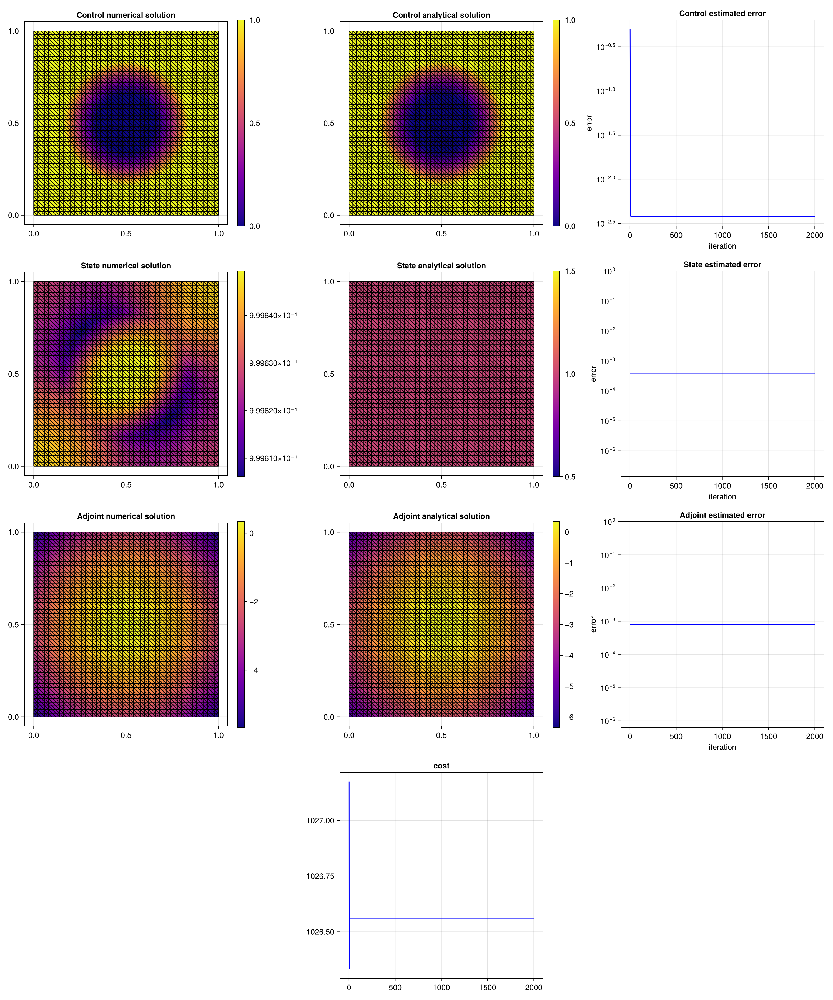

CairoMakie.Screen{IMAGE}


In [33]:
L2(u) = √(sum(∫( u*u )*dΩ))

ysol(x)=1
psol(x)=1/3-12∑((x[i]-0.5)^2 for i=1:2)

fig = CairoMakie.Figure(size=(1500, 1800))
titles=["Control","State","Adjoint"]
results=[us,ys,ps]
anasols=[usol,ysol,psol]
colrange=[(0,1),(0.5,1.5),(-1/3-6,1/3)]
for k=1:3
	ax = CairoMakie.Axis(fig[k,1], title="$(titles[k]) numerical solution", aspect=DataAspect())
	plt = CairoMakie.plot!(ax, Ω, results[k][end], colormap=:plasma)
	CairoMakie.wireframe!(ax, Ω, color=:black, linewidth=1)
	CairoMakie.Colorbar(fig[k,2], plt)

	ax = CairoMakie.Axis(fig[k,3], title="$(titles[k]) analytical solution", aspect=DataAspect())
	plt = CairoMakie.plot!(ax, Ω, anasols[k], colorrange=colrange[k], colormap=:plasma)
	CairoMakie.wireframe!(ax, Ω, color=:black, linewidth=1)
	CairoMakie.Colorbar(fig[k,4], plt)

	err=collect(L2(w-anasols[k]) for w in results[k])
	ax = CairoMakie.Axis(fig[k,5], title="$(titles[k]) estimated error", xlabel="iteration", ylabel="error", yscale=log10)
	CairoMakie.lines!(fig[k,5], err, color=:blue)
end
CairoMakie.Axis(fig[4,3], title="cost")
CairoMakie.lines!(fig[4,3], costs, color=:blue)

save("GradientMethod_ArmijoTest.pdf",fig)
display(fig)

## Use case: Armijo rule

Now another example, where we solve numerically the distributed optimal control problem with Armijo rule instead of exact step length

\begin{align*}
J(y, u) = \dfrac{1}{2} \| y - y_{\Omega}\|_{\Omega}^2 + \dfrac{\gamma}{2} \| u \|^2_{\Omega} \to \min
\end{align*}

subject to the state equation
\begin{alignat}{2}
-\Delta y &= f + \beta u & &\quad \text{in } \Omega,
\\
	y &= 0 & & \quad \text{on } \Gamma = \partial \Omega, 
\end{alignat}
and $u \in \mathcal{U}_{ad}$  for some convex subset of $\mathcal{U} = L^2(\Omega)$. Here,
$\beta $ is simply some positive constant, and for simplicity, we pick $\Omega = (0,1)^2 \subset \mathbb{R}^2$. 

Finally, our target function is 
$$y_{\Omega} = 10x_1(1-x_1)x_2(1-x_2).
$$.
This example is take from [ManzoniQuarteroniSalsa2021, Section 6.5.1, Test case 1](https://link.springer.com/10.1007/978-3-030-77226-0) and this text is from the Github repository notebook PoissonOCP.

Pay attention to variable names! The variables from example 1 still exist and might ruin this example if you mix up something.

In [4]:
using Gridap
using Gridap.Algebra
using GridapMakie, CairoMakie, FileIO

domain = (0,1,0,1)
partition = (50, 50)
model = CartesianDiscreteModel(domain, partition) |> simplexify

β = 1
f = 0
yΩ(x) = 10*x[1]*(1-x[1])*x[2]*(1-x[2])                          # goal function
yd(x) = 0                                                       # Dirichlet condition

reffe = ReferenceFE(lagrangian, Float64, 1)                     # order = 1

Testspace = TestFESpace(model, reffe, conformity=:H1, dirichlet_tags="boundary")
Trialspace = TrialFESpace(Testspace, yd)
Uspace = FESpace(model, reffe, conformity=:H1)					# FE space for control variable

Ω = Triangulation(model)
dΩ = Measure(Ω, 2)                                              # degree = 2

γ = 10^-6
J(y,u) = 1/2*sum(∫((y-yΩ)*(y-yΩ))*dΩ) + γ/2*sum(∫(u*u)*dΩ)      # cost functional, Good to know/mind variable scope: Note that J depends implicitly on γ. If you change γ, so will J!
∇j(u, p) = (γ*u + β*p)                                          # gradient of reduced cost

function solveSE(u,Trialspace,Testspace;w=nothing,dΩ=nothing,dΓ=nothing,cache=nothing,A=nothing,y_dof=fill(0.0, num_free_dofs(Trialspace)))
	if A==nothing
		a_SE(y,φ) = ∫(∇(y)⋅∇(φ))*dΩ
		A = assemble_matrix(a_SE, Trialspace, Testspace)
	end
	l_SE(φ) = ∫((f+β*u)*φ)*dΩ
	b = assemble_vector(l_SE, Testspace)                        # Compute corresponding state problem by reassembling rhs l and solve linear system using the cached LU decomposition
	op = AffineOperator(A, b)
	cache = solve!(y_dof, LUSolver(), op, cache, false)

	return y_dof, cache, A
end

function solveAE(y,Trialspace,Testspace;w=nothing,dΩ=nothing,dΓ=nothing,cache=nothing,A=nothing,p_dof=fill(0.0, num_free_dofs(Testspace)))
	if A==nothing
		a_AE(p, φ) = ∫(∇(p)⋅∇(φ))*dΩ
		A = assemble_matrix(a_AE, Trialspace, Testspace)		# Trialspace = Testspace because we have zero Dirichlet boundary conditions
	end
	l_AE(φ) = ∫((y-yΩ)*φ)*dΩ
	b = assemble_vector(l_AE, Testspace)
	op = AffineOperator(A, b)
	cache = solve!(p_dof, LUSolver(), op, cache, false)

	return p_dof, cache, A
end

(ys,us,ps,costs) = GradientDescent(solveSE=solveSE, solveAE=solveAE, spaces=(Trialspace, Testspace, Uspace), dΩ=dΩ, J=J, ∇j=∇j, saveall=true)

(SingleFieldFEFunction{GenericCellField{ReferenceDomain}}[SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction()  …  SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction()], SingleFieldFEFunction{GenericCellField{ReferenceDomain}}[SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction()  …  SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), SingleFieldFEFunction(), Sin

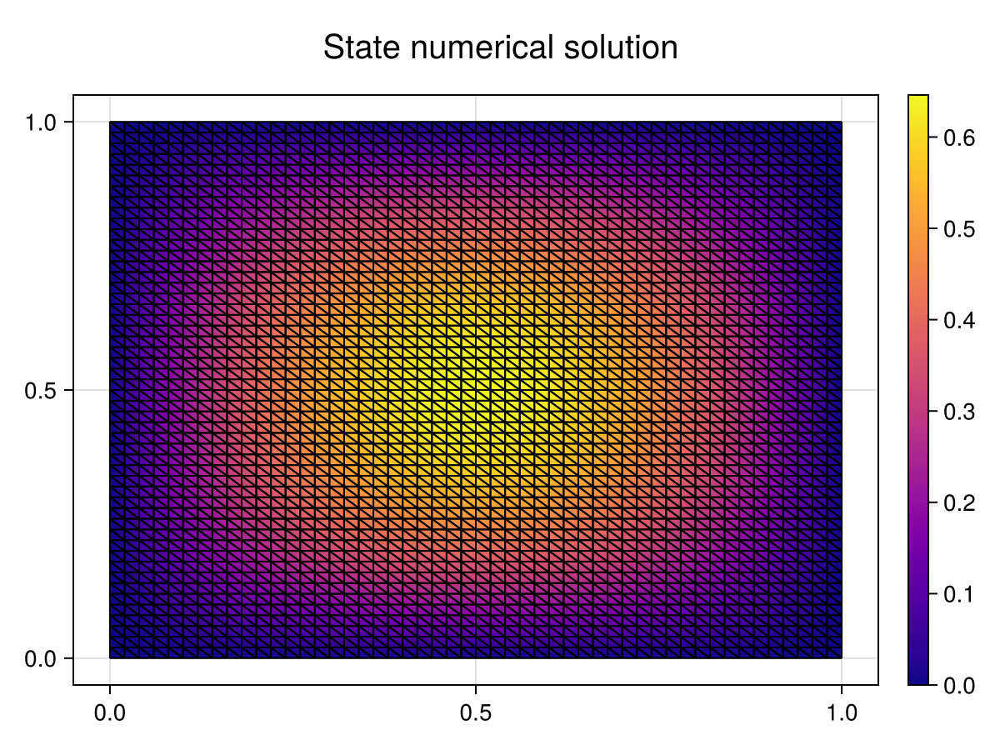

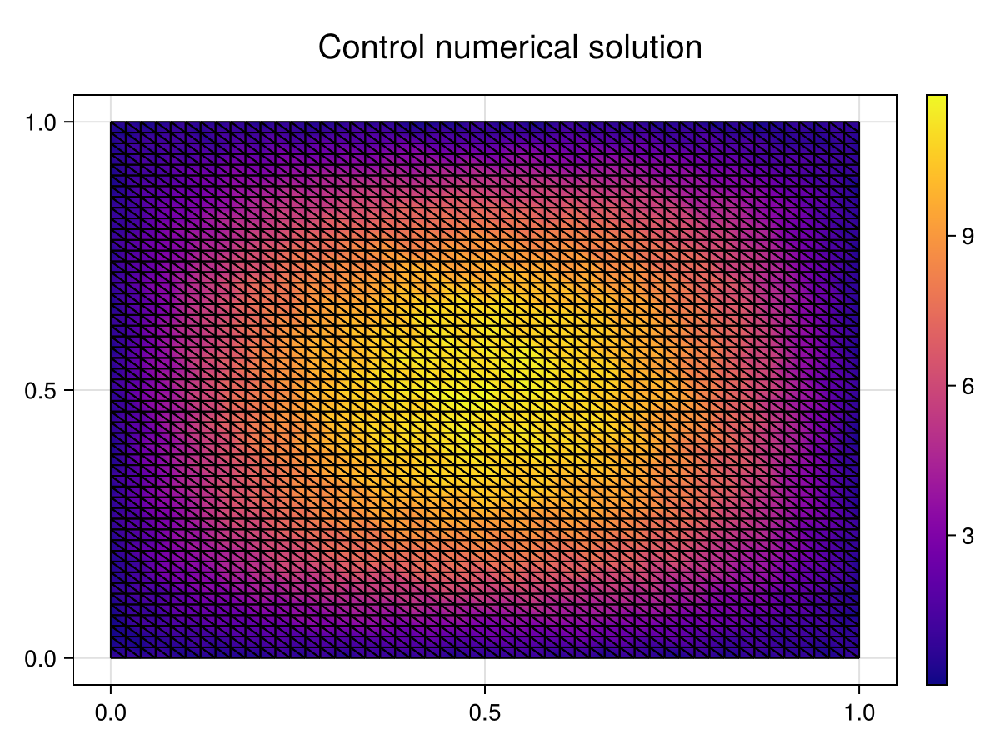

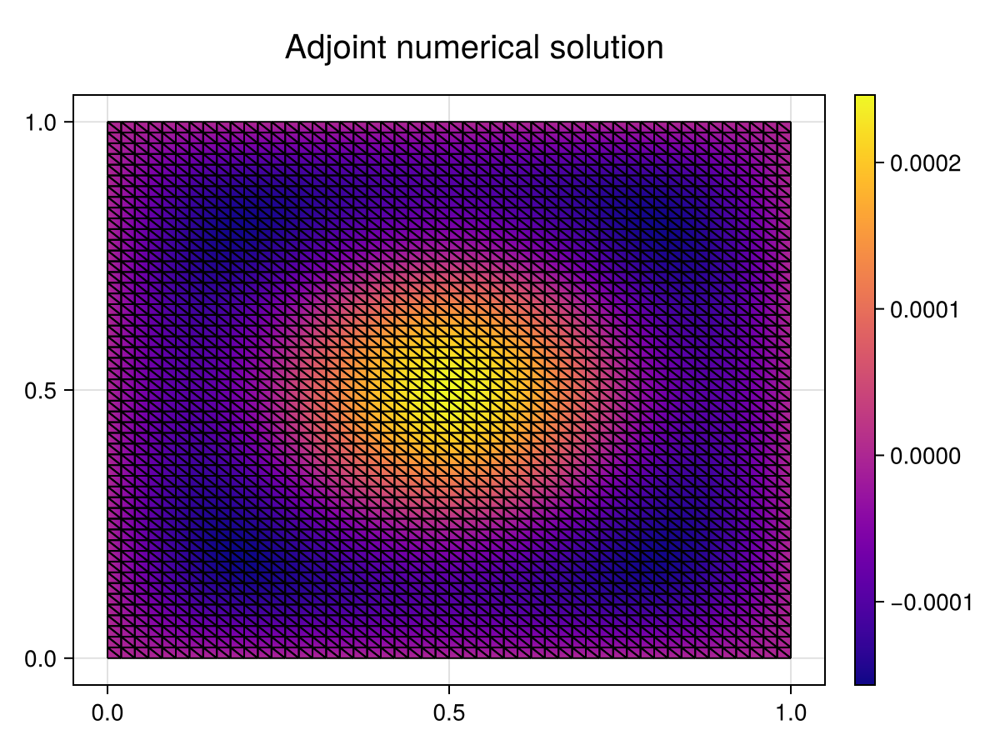

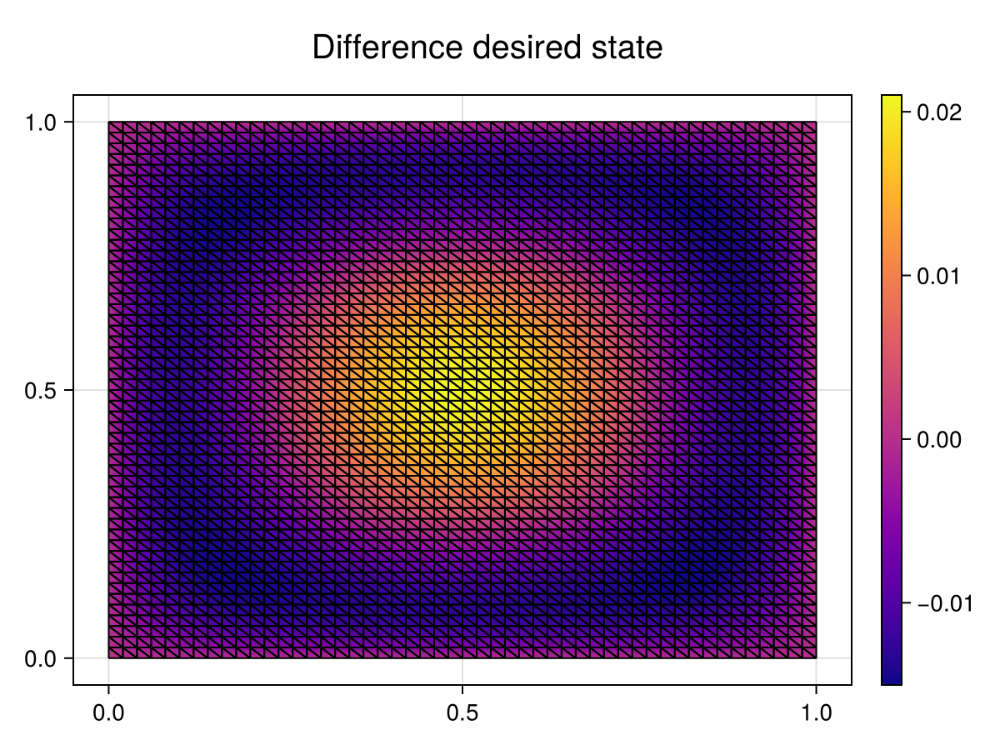

CairoMakie.Screen{IMAGE}


In [ ]:
function draw(u;label="")
	fig = CairoMakie.Figure()
	ax = CairoMakie.Axis(fig[1,1], title=label, aspect=DataAspect())
	plt = CairoMakie.plot!(ax, Ω, u, colormap=:plasma)
	CairoMakie.wireframe!(ax, Ω, color=:black, linewidth=1)
	CairoMakie.Colorbar(fig[1,2], plt)
	display(fig)
end

draw(ys[end],label="State numerical solution")
draw(us[end],label="Control numerical solution")
draw(ps[end],label="Adjoint numerical solution")

ydiff = y - yΩ                                            

draw(ydiff,label="Difference desired state")



draw(usol,label="Control solution")

Plots.plot(1:length(costs),costs,label="cost")
display(fig)

#@show L2uerror=√(∑(∫((usol-us[end])*(usol-us[end]))*dΩ))